## Setup

In [1]:
# https://umap-learn.readthedocs.io/en/latest/parametric_umap.html
import os
import tensorflow as tf
import keras
import scanpy as sc
import sklearn
import numpy as np
from umap.parametric_umap import ParametricUMAP
devices = tf.config.list_physical_devices()
print("\nDevices: ", devices)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  details = tf.config.experimental.get_device_details(gpus[0])
  print("GPU details: ", details)

/Users/bms20/anaconda3/envs/scanpy/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



Devices:  [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU details:  {'device_name': 'METAL'}


## Import data

/Users/bms20/anaconda3/envs/scanpy/lib/python3.10/site-packages/anndata/compat/__init__.py:311: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  warn(


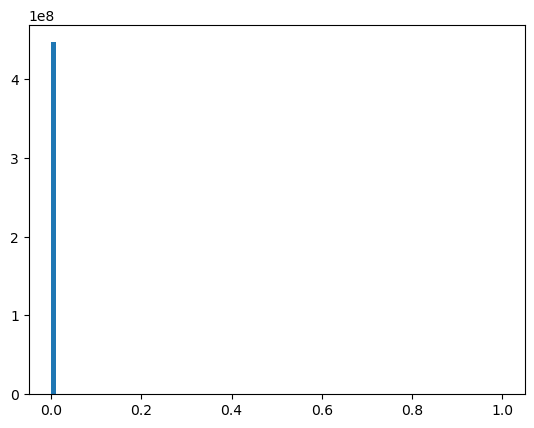

In [2]:
# from scanpy.datasets import pbmc68k_reduced
# ad = pbmc68k_reduced()
import anndata
ad=anndata.read_h5ad(os.path.expanduser("~/Downloads/ot.h5ad"))
sc.pp.normalize_total(ad,target_sum=1e4)
sc.pp.log1p(ad)
X = ad.X.toarray()
# X = ad.obsm['X_pca']
# X = np.log10(X+1)
# ## Normalise to range of 0-1 with sklearn sparse matrix
from sklearn.preprocessing import MinMaxScaler
X=MinMaxScaler(feature_range=(0,1)).fit_transform(X)



# plot dsitribution of values in X
import matplotlib.pyplot as plt
plt.hist(X.flatten(), bins=100)
plt.show()

In [3]:
from sklearn.decomposition import TruncatedSVD
Xsvd = TruncatedSVD(n_components=100).fit_transform(X)

## Define model

In [281]:
from keras_nlp.layers.attention import MultiHeadSelfAttention
from keras_nlp.layers.transformer import TransformerBlock
from keras_nlp import TransformerModel
from keras_nlp import TransformerEmbedding
from keras_nlp import TokenEmbedding
from keras_nlp import PositionalEmbedding
from keras_nlp import Transformer
from keras_nlp import Masked

from keras.layers import Input, Dense, Flatten, Reshape
## build model
from keras.models import Model
def build_model(dims, n_components=2):
    inputs = Input(shape=dims)
    x = TransformerBlock(attention_mask=Masked(mask_value=0))(inputs    

dims = [X.shape[1],1]
n_components = 2
def prepare_networks(
    dims,
    n_components=2,
    hidden=[1000,100,50],
    parametric_reconstruction=True,
):
    encoder = keras.Sequential(
        [
            keras.layers.Input(shape=dims),
            keras.layers.Flatten(),
            keras.layers.Dense(units=hidden[0], activation="relu"),
            keras.layers.Dense(units=hidden[1], activation="relu"),
            keras.layers.Dense(units=hidden[2], activation="relu"),
            keras.layers.Dense(units=n_components, name="z"),
        ]
    )

    if parametric_reconstruction:
        decoder = keras.Sequential(
            [
                keras.layers.Input(shape=(n_components,)),
                keras.layers.Dense(units=hidden[2], activation="relu"),
                keras.layers.Dense(units=hidden[1], activation="relu"),
                keras.layers.Dense(units=hidden[0], activation="relu"),
                keras.layers.Dense(
                    units=np.prod(dims), name="recon", activation=None
                ),
                keras.layers.Reshape(dims),
            ]
        )
    return encoder, decoder

encoder, decoder = prepare_networks(dims=dims)
encoder.summary()
decoder.summary()



Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_96201 (Flatten)     (None, 50)                0         
                                                                 
 dense_112 (Dense)           (None, 1000)              51000     
                                                                 
 dense_113 (Dense)           (None, 100)               100100    
                                                                 
 dense_114 (Dense)           (None, 50)                5050      
                                                                 
 z (Dense)                   (None, 2)                 102       
                                                                 
Total params: 156252 (610.36 KB)
Trainable params: 156252 (610.36 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "seque

## Train pUMAP

In [19]:
from umap import UMAP


# pass encoder network to ParametricUMAP
embedder = ParametricUMAP(parametric_embedding=True,
                          optimizer=keras.optimizers.legacy.Adam(learning_rate=0.001),
                          # parametric_reconstruction_loss_fcn="kl_divergence",
                          # encoder=encoder,
                          # decoder=decoder,
                          # parametric_reconstruction=True,  
                          # reconstruction_validation=ad.X.toarray(),
                          # autoencoder_loss=True,
                        #   global_correlation_loss_weight=.1,
                          n_neighbors=300,
                          verbose=True)
model = embedder.fit(X=Xsvd)

ParametricUMAP(optimizer=<keras.src.optimizers.legacy.adam.Adam object at 0x4592b8d60>)
Sun May 12 21:02:42 2024 Construct fuzzy simplicial set
Sun May 12 21:02:42 2024 Finding Nearest Neighbors
Sun May 12 21:02:42 2024 Building RP forest with 13 trees
Sun May 12 21:02:42 2024 NN descent for 15 iterations
	 1  /  15
	 2  /  15
	 3  /  15
	 4  /  15
	 5  /  15
	 6  /  15
	Stopping threshold met -- exiting after 6 iterations
Sun May 12 21:02:56 2024 Finished Nearest Neighbor Search
Sun May 12 21:02:58 2024 Construct embedding
Epoch 1/10
6320/6320 [==============================] - 177s 28ms/step - loss: 0.3908
Epoch 2/10
6320/6320 [==============================] - 177s 28ms/step - loss: 0.4078
Epoch 3/10
6320/6320 [==============================] - 175s 28ms/step - loss: 0.4124
Epoch 4/10
6320/6320 [==============================] - 177s 28ms/step - loss: 0.4152
Epoch 5/10
6320/6320 [==============================] - 178s 28ms/step - loss: 0.4183
Epoch 6/10
6320/6320 [==================

## Plot

{'loss': [0.3908422887325287, 0.4077954888343811, 0.4124314785003662, 0.41518768668174744, 0.4183327853679657, 0.4139809310436249, 0.41756609082221985, 0.41669321060180664, 0.4222906231880188, 0.42238110303878784]}


Text(0.5, 0, 'Epoch')

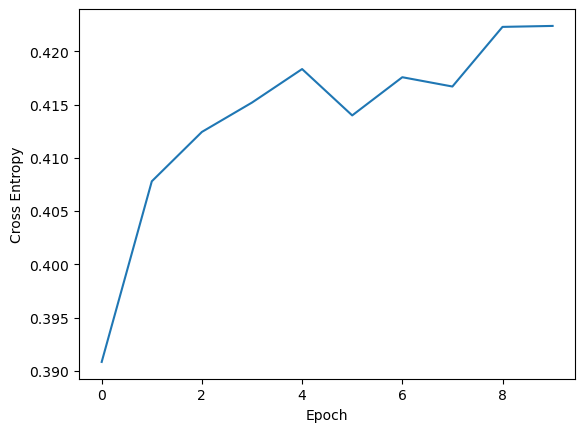

In [20]:
import matplotlib.pyplot as plt
print(embedder._history)
fig, ax = plt.subplots()
ax.plot(embedder._history['loss'])
ax.set_ylabel('Cross Entropy')
ax.set_xlabel('Epoch')

In [21]:
## Prepare embedding df
import plotly.express as px
import pandas as pd
embedding = model.embedding_
# embedding = model.transform(X)
# embedding = model.encoder(X)

embedding_df = pd.DataFrame(embedding, columns=["x", "y"], index=ad.obs_names)
embedding_df = pd.concat([ad.obs, embedding_df], axis=1)
embedding_df['seurat_clusters'] = embedding_df['seurat_clusters'].astype(str)
embedding_df

,orig.ident,nCount_score,nFeature_score,file,study_id,n_cases,n_initial,n_replication,pmid,pub_author,...,uberon_id,mp_id,omit_id,pato_id,hancestro_id,ncbitaxon_id,score_snn_res.0.8,seurat_clusters,x,y
FINNGEN_R6_AB1_BACTINF_NOS,0,0.994799,22,part-00000-6861a19f-dc33-4e69-b812-de1503d45ac...,FINNGEN_R6_AB1_BACTINF_NOS,25458,260213,0,NA,FINNGEN_R6,...,NA,NA,NA,NA,NA,NA,67,67,-40.550961,-38.064587
FINNGEN_R6_AB1_CANDIDIASIS,0,1.365944,9,part-00000-6861a19f-dc33-4e69-b812-de1503d45ac...,FINNGEN_R6_AB1_CANDIDIASIS,2404,258019,0,NA,FINNGEN_R6,...,NA,NA,NA,NA,NA,NA,2,2,-3.213306,-5.058605
FINNGEN_R6_AB1_CHLAMYDIA_OTHER,0,0.461980,13,part-00000-6861a19f-dc33-4e69-b812-de1503d45ac...,FINNGEN_R6_AB1_CHLAMYDIA_OTHER,1255,254601,0,NA,FINNGEN_R6,...,NA,NA,NA,NA,NA,NA,8,8,-18.546108,-19.201397
FINNGEN_R6_AB1_DERMATOPHYTOSIS,0,1.463561,4,part-00000-6861a19f-dc33-4e69-b812-de1503d45ac...,FINNGEN_R6_AB1_DERMATOPHYTOSIS,2001,257616,0,NA,FINNGEN_R6,...,NA,NA,NA,NA,NA,NA,0,0,-4.785747,-7.607616
FINNGEN_R6_AB1_HERPES_SIMPLEX,0,1.054205,8,part-00000-6861a19f-dc33-4e69-b812-de1503d45ac...,FINNGEN_R6_AB1_HERPES_SIMPLEX,1969,253917,0,NA,FINNGEN_R6,...,NA,NA,NA,NA,NA,NA,0,0,-5.283002,-7.626904
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SAIGE_960,0,0.908504,12,part-00035-6861a19f-dc33-4e69-b812-de1503d45ac...,SAIGE_960,18430,400227,0,NA,UKB SAIGE,...,NA,NA,NA,NA,NA,NA,42,42,8.326818,7.339680
SAIGE_960_2,0,1.003017,12,part-00035-6861a19f-dc33-4e69-b812-de1503d45ac...,SAIGE_960_2,16090,397887,0,NA,UKB SAIGE,...,NA,NA,NA,NA,NA,NA,42,42,9.131505,8.010303
SAIGE_965,0,0.537922,12,part-00035-6861a19f-dc33-4e69-b812-de1503d45ac...,SAIGE_965,6910,388707,0,NA,UKB SAIGE,...,NA,NA,NA,NA,NA,NA,2,2,-7.979457,-11.717815
SAIGE_965_1,0,0.989611,7,part-00035-6861a19f-dc33-4e69-b812-de1503d45ac...,SAIGE_965_1,1150,382947,0,NA,UKB SAIGE,...,NA,NA,NA,NA,NA,NA,31,31,-1.355769,-6.080151


In [22]:
fig1 = px.density_contour(embedding_df,
                        hover_data=['nFeature_score','id','seurat_clusters'],
                         x="x", y="y", 
                        #  color='ancestor_name_abnormality',
                        #  marginal_x="histogram", marginal_y="histogram", 
                         )
# fig1.update_traces(contours_coloring="fill", contours_showlabels = True)
fig1.show()

In [23]:
fig = px.scatter(data_frame=embedding_df, 
                 x="x", y="y",
                #  color='ancestor_name_abnormality',
                #  color='q.ventricular.cardiac.muscle.cell',
                 hover_data=['nFeature_score','id','seurat_clusters'],
                 opacity=0.7,  
                 size='nFeature_score',
                 template='plotly_dark',
                 color_continuous_midpoint=.7,
                 color_continuous_scale='viridis_r',
                 height=800, width=1200) 
## Add 2d density plot of marker density
## remove marker outline from plot
fig.update_traces(marker_line_width=0)
## Set min marker size
fig.update_traces(marker=dict(sizemin=1))
fig.show()

In [24]:
## Merged contour + scatter plot
import plotly.graph_objects as go
fig3 = go.Figure(data=fig1.data + fig.data)
fig3.show()

In [184]:
embedding_df

,orig.ident,nCount_score,nFeature_score,id,disease_id,disease_name,qualifier,reference,evidence,onset,...,q.trophoblast.cell,q.trophoblast.giant.cell,q.type.II.pneumocyte,q.ventricular.cardiac.muscle.cell,q.visceromotor.neuron,top_celltype,score_snn_res.0.8,seurat_clusters,x,y
HP:0000001,0,28996.419444,4978,HP:0000001,NA,NA,NA,NA,NA,NA,...,0.999999,0.999999,1.0,1.00000,0.999999,ciliated epithelial cell,19,19,33.198307,27.775681
HP:0000002,0,8732.554762,1495,HP:0000002,OMIM:144750,"Hyperostosis, endosteal",NOT,OMIM:144750,TAS,,...,0.999999,0.999999,1.0,1.00000,0.999999,mesenchymal stem cell,14,14,54.675365,93.233971
HP:0000003,0,325.750000,93,HP:0000003,OMIM:107480,Townes-Brocks syndrome 1,,OMIM:107480,IEA,,...,0.999999,0.999999,1.0,1.00000,0.999999,metanephric podocyte,25,25,40.564610,85.063751
HP:0000005,0,39820.841667,4648,HP:0000005,NA,NA,NA,NA,NA,NA,...,0.999999,0.999999,1.0,1.00000,0.999999,innate lymphoid cell,19,19,35.389614,56.385567
HP:0000006,0,15326.453193,1920,HP:0000006,OMIM:619340,Developmental and epileptic encephalopathy 96,,PMID:31675180,PCS,,...,0.848977,0.999999,1.0,0.54919,0.999999,lens fiber cell,27,27,-3.759573,111.937866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HP:6000133,0,10.000000,1,HP:6000133,OMIM:250800,Methemoglobinemia due to deficiency of methemo...,,PMID:8874222,PCS,,...,0.999999,0.999999,1.0,1.00000,0.999999,GABAergic neuron,3,3,34.638607,81.758522
HP:6000134,0,15.000000,1,HP:6000134,OMIM:614307,Alpha-methylacyl-CoA racemase deficiency,,PMID:10655068,PCS,,...,0.999999,0.999999,1.0,1.00000,0.999999,gastric goblet cell,9,9,35.001492,81.385910
HP:6000147,0,4.000000,1,HP:6000147,OMIM:618156,Squalene synthase deficiency,,PMID:32027475,PCS,,...,0.999999,0.999999,1.0,1.00000,0.999999,cortical cell of adrenal gland,3,3,34.628735,82.256561
HP:6000158,0,22.000000,1,HP:6000158,OMIM:257220,"Niemann-pick disease, type C1",,PMID:25665455,PCS,,...,0.999999,0.999999,1.0,1.00000,0.999999,cortical cell of adrenal gland,9,9,34.967388,81.762451
